In [ ]:
# Check YOLO Dataset Structure
import os
import yaml
import sys
from IPython.display import display, Markdown

# Add dataset folder to path (for imports)
sys.path.append(os.path.join(os.getcwd(), "Datasets"))

print("Environment ready. Current working directory:", os.getcwd())

Environment ready. Current working directory: c:\Users\Admin\Desktop\NEU 4\Computer Vision\Midterm\Object Detection\Object Detection


In [ ]:
# Verify dataset
from prepare_data import check_dataset_structure

base_path = os.path.join(os.getcwd(), "Data_balanced")

check_dataset_structure(base_path)

TRAIN -> 20096 images, 20096 labels
All labels matched.
VALID -> 1748 images, 1748 labels
All labels matched.
TEST -> 1717 images, 1717 labels
All labels matched.


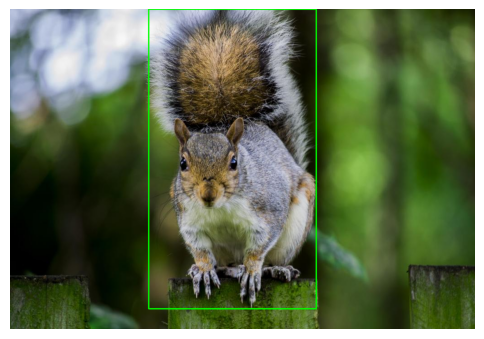

In [ ]:
import cv2
import matplotlib.pyplot as plt

def visualize_sample(img_path, label_path):
    img = cv2.imread(img_path)
    h, w, _ = img.shape
    with open(label_path, "r") as f:
        labels = f.readlines()

    for line in labels:
        cls, x, y, bw, bh = map(float, line.strip().split())
        x1 = int((x - bw/2) * w)
        y1 = int((y - bh/2) * h)
        x2 = int((x + bw/2) * w)
        y2 = int((y + bh/2) * h)
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(img, f"{int(cls)}", (x1, y1-5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)

    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()

# Pick a random sample from train/images
sample_img = os.path.join(base_path, "train", "images", os.listdir(os.path.join(base_path, "train", "images"))[0])
sample_lbl = os.path.join(base_path, "train", "labels", os.path.splitext(os.path.basename(sample_img))[0] + ".txt")

visualize_sample(sample_img, sample_lbl)

In [ ]:
# Read data.yaml file for verification
yaml_path = os.path.join(base_path, "data.yaml")

with open(yaml_path, "r") as f:
    data_cfg = yaml.safe_load(f)

print("Dataset config loaded:")
print(f"Train path: {data_cfg['train']}")
print(f"Valid path: {data_cfg['val']}")
print(f"Test path: {data_cfg['test']}")
print(f"Number of classes: {data_cfg['nc']}")
print(f"Example class names: {list(data_cfg['names'].values())[:10]}")

Dataset config loaded:
Train path: ../train/images
Valid path: ../valid/images
Test path: ../test/images
Number of classes: 54
Example class names: ['Zebra', 'Lion', 'Leopard', 'Cheetah', 'Tiger', 'Bear', 'Butterfly', 'Canary', 'Crocodile', 'Bull']


In [5]:
import sys, os
sys.path.append(os.path.join(os.getcwd(), "src"))

In [28]:
import os
import sys
from pathlib import Path

DATASET_NAME = "Animal-segmentation-1" 
DATASET_PATH = Path(os.getcwd()) / DATASET_NAME 

print(f"Checking dataset structure at: {DATASET_PATH}")

Checking dataset structure at: c:\Users\Admin\Desktop\NEU 4\Computer Vision\Midterm\Object Detection\Object Detection\Animal-segmentation-1


In [ ]:
from datetime import datetime
import sys 
from train import start_yolov8_training 
from pathlib import Path
import os

# --- Define Args class ---
class Args:
    task = "detect" 
    data = "Data_balanced/data.yaml" 
    model = "yolov8n.pt"         
    epochs = 100
    imgsz = 640
    batch = 32
    patience = 10
    project = "experiments/yolov8_animal_detection"
    name = "fixed_run" 
    device = "0"
    exist_ok = True
    extra = ""
    workers = 2 
    
# 1. Collect all class attributes into a dictionary
config_dict = {
    key: value for key, value in Args.__dict__.items() 
    if not key.startswith('__') and not callable(value)
}

# 2. Create a dummy object for dot notation access (e.g., args.task)
class ConfigObject:
    def __init__(self, dictionary):
        for key, value in dictionary.items():
            setattr(self, key, value)
            
args_instance = ConfigObject(config_dict)

print(f"Cấu hình đào tạo: task={args_instance.task}, epochs={args_instance.epochs}, model={args_instance.model}")

# Start training
try:
    exp_dir = start_yolov8_training(args_instance)
    print(f"\n[OK] Hoàn thành! Kết quả được lưu tại: {exp_dir}")
except SystemExit:
    print("Quá trình đào tạo thất bại.")
    sys.exit(1)

Cấu hình đào tạo: task=detect, epochs=100, model=yolov8n.pt
[CMD] yolo task=detect mode=train data=Data_balanced/data.yaml model=yolov8n.pt epochs=100 imgsz=640 batch=32 patience=10 device=0 exist_ok=True workers=2 project=experiments/yolov8_animal_detection name=fixed_run
New https://pypi.org/project/ultralytics/8.3.222 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.209  Python-3.10.11 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=Data_balanced/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=F

Evaluate


In [3]:
from src import inference as inf
from pathlib import Path

In [4]:
WEIGHTS_PATH = Path(r"C:\Users\Admin\Desktop\NEU 4\Computer Vision\Midterm\Object Detection\Object Detection\experiments\yolov8_animal_detection\fixed_run\weights\best.pt")
DATA_YAML_PATH = Path(r"C:\Users\Admin\Desktop\NEU 4\Computer Vision\Midterm\Object Detection\Object Detection\Data\data.yaml")
TEST_PATH = Path(r"C:\Users\Admin\Desktop\NEU 4\Computer Vision\Midterm\Object Detection\Object Detection\experiments\yolov8_animal_detection\fixed_run_test")
OUTPUT_CSV_PATH = Path(r"C:\Users\Admin\Desktop\NEU 4\Computer Vision\Midterm\Object Detection\Object Detection\evaluation_results\test_metrics.csv")

# Confidence threshold
CONF_THRESHOLD = 0.4

In [5]:
# --- RUN EVALUATION MODE ---
print("=" * 50)
print("MODE: PERFORMANCE EVALUATION (METRICS)")
print("=" * 50)

evaluation_results = inf.run_evaluation(WEIGHTS_PATH, DATA_YAML_PATH, OUTPUT_CSV_PATH, TEST_PATH)

MODE: PERFORMANCE EVALUATION (METRICS)

Starting evaluation on test split...
Ultralytics 8.3.209  Python-3.10.11 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
Model summary (fused): 72 layers, 3,016,178 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 698.3397.4 MB/s, size: 315.3 KB)
val: Scanning C:\Users\Admin\Desktop\NEU 4\Computer Vision\Midterm\Object Detection\Object Detection\Data\test\labels.cache... 1717 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1717/1717 1.7Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 108/108 5.7it/s 19.1s0.2s
                   all       1717       1992      0.829      0.752      0.836      0.709
                 Zebra         17         24      0.973      0.917      0.947      0.809
                  Lion         40         43      0.882       0.93      0.956      0.838
               Leopard         17         17  

Inference

Running inference on 9 random image(s)...

0: 640x640 1 Frog, 26.8ms
1: 640x640 1 Spider, 26.8ms
2: 640x640 1 Horse, 26.8ms
3: 640x640 1 Duck, 26.8ms
4: 640x640 3 Monkeys, 26.8ms
5: 640x640 1 Cheetah, 26.8ms
6: 640x640 1 Lion, 26.8ms
7: 640x640 1 Raccoon, 26.8ms
8: 640x640 1 Squirrel, 26.8ms
Speed: 5.1ms preprocess, 26.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
Inference hoàn tất.


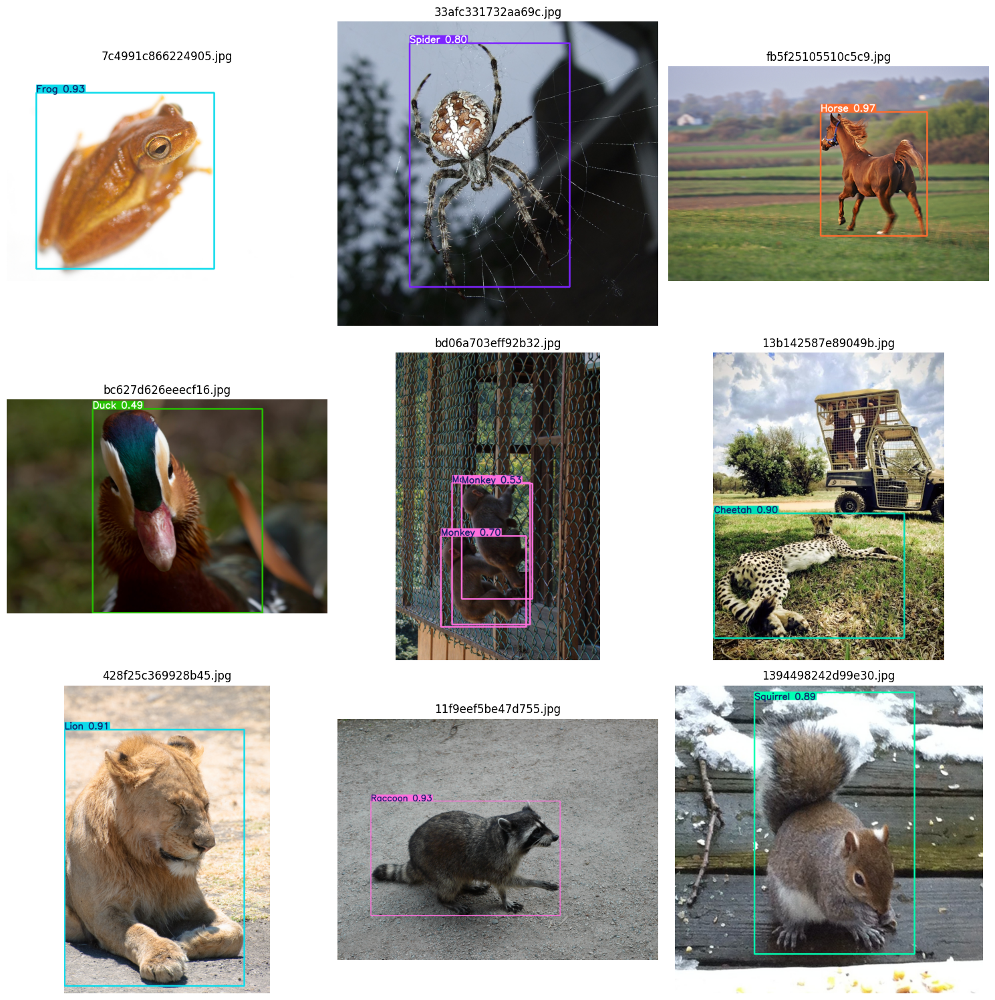

In [6]:
%matplotlib inline
import matplotlib.pyplot as plt
from pathlib import Path
from ultralytics import YOLO
import random
import cv2 

def visualize_inference_results(weights_path, source_dir, num_images_to_show=9, conf_threshold=0.5):
    """
    Run inference on a random subset of images from a folder and display results
    in a grid.

    Args:
        weights_path (str | Path): Path to the .pt weights file.
        source_dir (str | Path): Directory containing test images.
        num_images_to_show (int): Number of random images to display.
        conf_threshold (float): Confidence threshold for predictions.
    """

    # --- 1. Prepare paths and image list ---
    source_path = Path(source_dir)
    if not source_path.is_dir():
        print(f"Error: Source path '{source_path}' is not a directory.")
        return
    
    image_files = list(source_path.glob('*.[jp][pn]g')) + list(source_path.glob('*.jpeg'))
    if not image_files:
        print(f"Error: No images found in '{source_path}'.")
        return

    if len(image_files) > num_images_to_show:
        images_to_predict = random.sample(image_files, num_images_to_show)
    else:
        images_to_predict = image_files
        num_images_to_show = len(images_to_predict)

    # --- 2. Load model and run inference ---
    try:
        model = YOLO(weights_path)
    except Exception as e:
        print(f"Error loading model: {e}")
        return

    print(f"Running inference on {num_images_to_show} random image(s)...")
    results = model.predict(source=images_to_predict, conf=conf_threshold)
    print("Inference hoàn tất.")

    # --- 3. Plot results in a grid ---
    if not results:
        print("No results returned by the model.")
        return

    cols = 3
    rows = (num_images_to_show + cols - 1) // cols  

    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
    axes = axes.flatten() 

    for i, r in enumerate(results):
        ax = axes[i]
        
        # r.plot() returns a BGR image (OpenCV format)
        im_array_bgr = r.plot()
        
        # Convert to RGB for matplotlib
        im_array_rgb = cv2.cvtColor(im_array_bgr, cv2.COLOR_BGR2RGB)
        
        ax.imshow(im_array_rgb)
        ax.set_title(Path(r.path).name) 
        ax.axis('off')

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage (update paths)
SOURCE_DIRECTORY = Path(r"C:\Users\Admin\Desktop\NEU 4\Computer Vision\Midterm\Object Detection\Object Detection\Data\test\images")

NUM_IMAGES = 9
CONF_THRESHOLD = 0.4

visualize_inference_results(
    weights_path=WEIGHTS_PATH,
    source_dir=SOURCE_DIRECTORY,
    num_images_to_show=NUM_IMAGES,
    conf_threshold=CONF_THRESHOLD
)

In [7]:
import sys
from pathlib import Path

sys.path.append('src')
from visualize import display_params, display_images, plot_training_results, visualize_test_metrics

BASE_EXPERIMENTS_DIR = Path('experiments/yolov8_animal_detection')
RESULTS_FOLDER_NAME = 'fixed_run'

results_path = BASE_EXPERIMENTS_DIR / RESULTS_FOLDER_NAME

if not results_path.exists():
    print("Error: Could not find one or both experiment folders.")
    print(f"Checked path (results): {results_path}")
else:
    print(f"Visualizing results for experiment: {RESULTS_FOLDER_NAME}")

Visualizing results for experiment: fixed_run


In [8]:
if results_path.exists():
    params_file = results_path / 'params.json'
    display_params(params_file)

--- Training Parameters ---
task: detect
data: Data_balanced/data.yaml
model: yolov8n.pt
epochs: 100
imgsz: 640
batch: 32
patience: 10
project: experiments/yolov8_animal_detection
name: fixed_run
device: 0
exist_ok: True
extra: 
workers: 2
------------------------------


--- 1. PERFORMANCE PLOTS ---


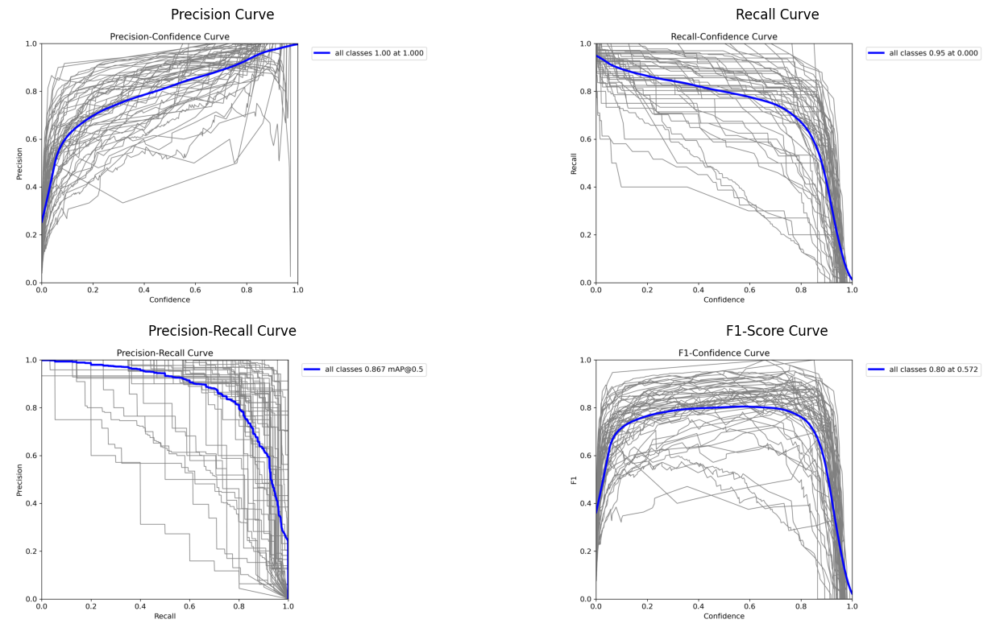

In [9]:
if results_path.exists():
    performance_plots = [
        results_path / 'BoxP_curve.png',
        results_path / 'BoxR_curve.png',
        results_path / 'BoxPR_curve.png',
        results_path / 'BoxF1_curve.png'
    ]
    
    titles = ['Precision Curve', 'Recall Curve', 'Precision-Recall Curve', 'F1-Score Curve']
    
    print("--- 1. PERFORMANCE PLOTS ---")
    display_images(performance_plots, titles=titles, cols=2, figure_size=(15, 8))


--- 2. CONFUSION MATRIX ---


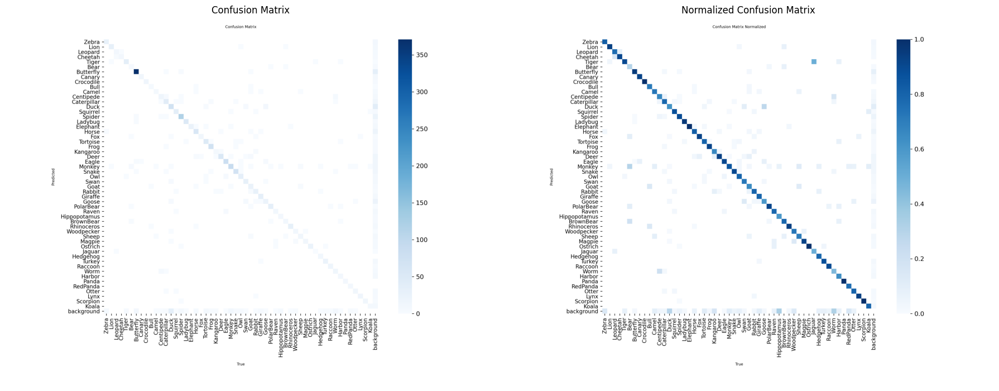

In [10]:
if results_path.exists():
    confusion_matrices = [
        results_path / 'confusion_matrix.png',
        results_path / 'confusion_matrix_normalized.png'
    ]
    
    titles = ['Confusion Matrix', 'Normalized Confusion Matrix']
    
    print("\n--- 2. CONFUSION MATRIX ---")
    display_images(confusion_matrices, titles=titles, cols=2, figure_size=(18, 7))


--- 3. TRAINING ANALYSIS FROM RESULTS.CSV ---


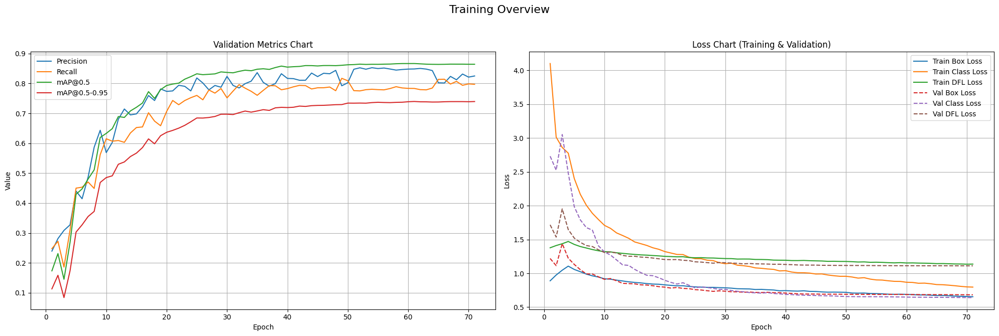

In [11]:
if results_path.exists():
    results_csv = results_path / 'results.csv'
    
    print("\n--- 3. TRAINING ANALYSIS FROM RESULTS.CSV ---")
    plot_training_results(results_csv)


--- 4. FINAL EVALUATION RESULTS ---


c:\Users\Admin\Desktop\NEU 4\Computer Vision\Midterm\Object Detection\Object Detection\src\visualize.py:174: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='mAP50-95', y='class', data=per_class_metrics, ax=ax1, palette='plasma')
c:\Users\Admin\Desktop\NEU 4\Computer Vision\Midterm\Object Detection\Object Detection\src\visualize.py:186: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='mAP50', y='class', data=per_class_metrics, ax=ax2, palette='cividis')


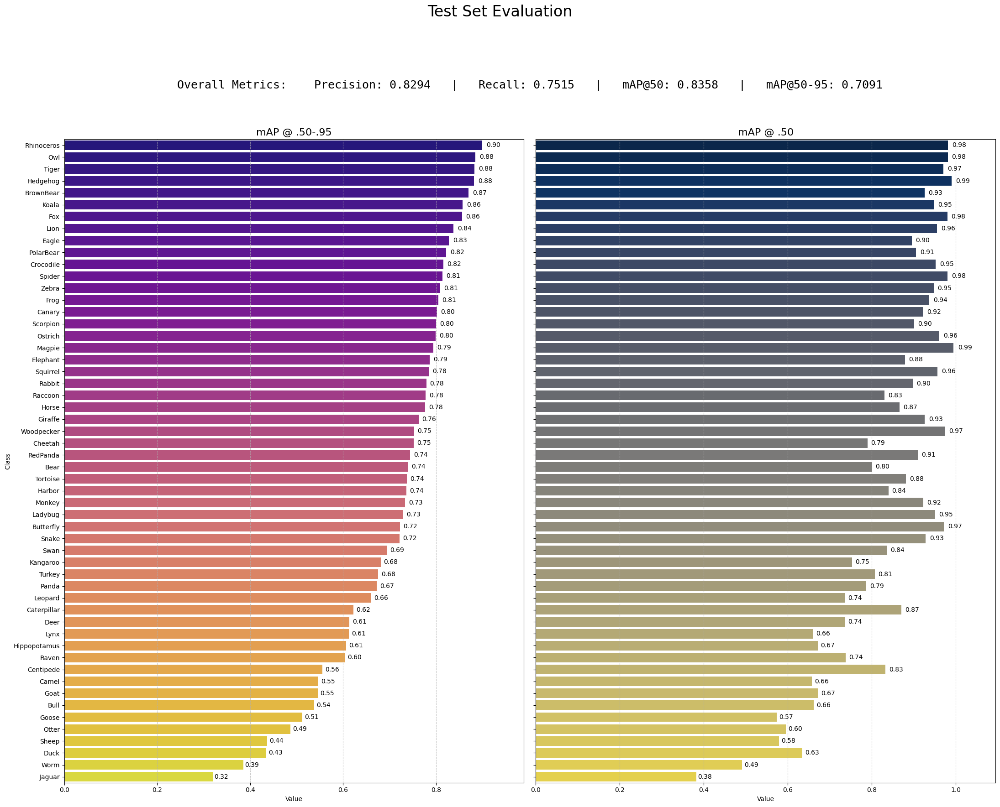

In [12]:
# --- VISUALIZE FINAL EVALUATION RESULTS ON TEST SET ---

print("\n" + "="*50)
print("--- 4. FINAL EVALUATION RESULTS ---")
print("="*50)

evaluation_file_path = Path('evaluation_results/test_metrics.csv')

if evaluation_file_path.exists():
    visualize_test_metrics(evaluation_file_path)
else:
    print(f"Error: Evaluation file not found at: {evaluation_file_path}")

In [27]:
from inference import load_yolo_model, predict_on_source, display_results
from pathlib import Path
import os

VIDEO_PATH = Path(r"C:\Users\Admin\Desktop\NEU 4\Computer Vision\Midterm\Object Detection\Object Detection\vid_test.mp4")
WEIGTHS_PATH = str(r"C:\Users\Admin\Desktop\NEU 4\Computer Vision\Midterm\Object Detection\Object Detection\experiments\yolov8_animal_detection\fixed_run\weights\best.pt") 

# Load YOLO model
model = load_yolo_model(WEIGTHS_PATH)

if model:
    print(f"\n--- STARTING VIDEO INFERENCE ---")
    
    # 1. Run inference
    results_generator = predict_on_source(
        model, 
        source_path=VIDEO_PATH, 
        conf_threshold=0.4
    )
    
    # 2. Display results
    display_results(results_generator)

else:
    print("Cannot run inference because the model failed to load.")

Model loaded successfully from:C:\Users\Admin\Desktop\NEU 4\Computer Vision\Midterm\Object Detection\Object Detection\experiments\yolov8_animal_detection\fixed_run\weights\best.pt

--- STARTING VIDEO INFERENCE ---
Displaying results... Press 'q' to quit.

video 1/1 (frame 1/5986) C:\Users\Admin\Desktop\NEU 4\Computer Vision\Midterm\Object Detection\Object Detection\vid_test.mp4: 384x640 1 BrownBear, 20.6ms
video 1/1 (frame 2/5986) C:\Users\Admin\Desktop\NEU 4\Computer Vision\Midterm\Object Detection\Object Detection\vid_test.mp4: 384x640 1 BrownBear, 21.5ms
video 1/1 (frame 3/5986) C:\Users\Admin\Desktop\NEU 4\Computer Vision\Midterm\Object Detection\Object Detection\vid_test.mp4: 384x640 (no detections), 22.4ms
video 1/1 (frame 4/5986) C:\Users\Admin\Desktop\NEU 4\Computer Vision\Midterm\Object Detection\Object Detection\vid_test.mp4: 384x640 (no detections), 25.8ms
video 1/1 (frame 5/5986) C:\Users\Admin\Desktop\NEU 4\Computer Vision\Midterm\Object Detection\Object Detection\vid_test